In [80]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
%matplotlib inline

import pyrosetta; pyrosetta.init()

import pyrosetta
from pyrosetta.rosetta.core.pack.task import TaskFactory
from pyrosetta.rosetta.core.pack.task.operation import RestrictToRepacking
from pyrosetta.rosetta.protocols.minimization_packing import PackRotamersMover
from pyrosetta.rosetta.core.select.residue_selector import ResidueIndexSelector
from pyrosetta.rosetta.core.pack.task.operation import OperateOnResidueSubset
from pyrosetta.rosetta.protocols.relax import FastRelax
from pyrosetta.rosetta.core.pack.task import TaskFactory
from pyrosetta.rosetta.core.pack.task.operation import RestrictToRepacking, IncludeCurrent
# Set up FastRelax with the desired score function
from pyrosetta import *


┌──────────────────────────────────────────────────────────────────────────────┐
│                                 PyRosetta-4                                  │
│              Created in JHU by Sergey Lyskov and PyRosetta Team              │
│              (C) Copyright Rosetta Commons Member Institutions               │
│                                                                              │
│ NOTE: USE OF PyRosetta FOR COMMERCIAL PURPOSES REQUIRE PURCHASE OF A LICENSE │
│         See LICENSE.PyRosetta.md or email license@uw.edu for details         │
└──────────────────────────────────────────────────────────────────────────────┘
PyRosetta-4 2024 [Rosetta PyRosetta4.Release.python310.linux 2024.39+release.59628fbc5bc09f1221e1642f1f8d157ce49b1410 2024-09-23T07:49:48] retrieved from: http://www.pyrosetta.org
core.init: Checking for fconfig files in pwd and ./rosetta/flags
core.init: Rosetta version: PyRosetta4.Release.python310.linux r387 2024.39+release.59628fb 59628fbc5bc09f1

In [81]:
from multiprocessing import Pool

def calcualte_energy(pdb , number):
    pose = pose_from_pdb(pdb)
    scorefxn = pyrosetta.create_score_function("ref2015_cart")
    # Create a TaskFactory to control packing
    tf = TaskFactory()
    # Restrict packing to only repack the existing rotamers (no mutations)
    tf.push_back(RestrictToRepacking())
    # Create and apply the packer
    packer = PackRotamersMover(scorefxn, tf.create_task_and_apply_taskoperations(pose))
    packer.apply(pose)
    relax = FastRelax()
    relax.set_scorefxn(scorefxn)
    relax.apply(pose)
    pose.dump_pdb(pdb)
    return scorefxn(pose)

# Function to run FastRelax in parallel
def run_parallel_fastrelax(pdbs, num_jobs=2):
    """ Run multiple FastRelax jobs in parallel. """
    # Create a multiprocessing pool with num_jobs workers
    with Pool(num_jobs) as pool:
        # Run FastRelax jobs in parallel
        results = pool.starmap(calcualte_energy, [(pdbs[i], i) for i in range(num_jobs)])
    return results


In [82]:
folder_path = "/home/ueharam1/projects4/seqft2/multiflow/fmif/log"
file_names = os.listdir(folder_path)
protein_name_list =[  file[12:-4] for file in file_names if 'tds4' in file ]

In [83]:
print(protein_name_list)
print(len(protein_name_list))


['1F0M', 'XX|run7_0974_0003', '2YSB', '2B89', '4v2_6IVS', '1YU5', '41YU5', 'GG|run6_0851_0003', '42MWA', '41F0M', '4HEEH_rd4_0349', '42YSB', '41TG0', '1TG0', 'HEEH_rd4_0349', 'r6_560_TrROS_Hall', 'v2_6IVS', '4XX|run7_0974_0003', '2MWA', '2MSG', '4EHEE_rd4_0625', '4HEEH_KT_rd6_0746', 'EHEE_rd4_0625', '42JT1', '42B89', '4r6_560_TrROS_Hall', '1V1C', '42M2J', '4XX|run5_1034_0004', '2M2J', '2JT1', '2MA4', 'XX|run5_1034_0004', '4EA|run5_0050_0004', '42MSG', '41V1C', '4GG|run6_0851_0003', 'HEEH_KT_rd6_0746', '42MA4', 'EA|run5_0050_0004']
40


In [90]:
protein_list = []
energy_tds_list = []
energy_dps_list = []


recovery_num = [ ]
recovery_dps_num = []
rmsd_num = []
rmsd_dps_num = []
energy_num = []
energy_dps_num =[ ]
energy_wild =[ ]

for protein_name in protein_name_list:
    if ("recovery_dps"+ protein_name + ".npz") in file_names:
        print(protein_name)
        protein_list.append(protein_name)
        
        recovery_list = np.load("/home/ueharam1/projects4/seqft2/multiflow/fmif/log/recovery_tds4" + protein_name + ".npz")['reward']
        recovery_num.append(recovery_list)
        
        recovery_dps = np.load("/home/ueharam1/projects4/seqft2/multiflow/fmif/log/recovery_dps"+ protein_name + ".npz")['reward']
        recovery_dps_num.append(recovery_dps)

        rmsd_list = np.load("/home/ueharam1/projects4/seqft2/multiflow/fmif/log/bb_rmsd_tds4"+ protein_name + ".npz")['reward']
        rmsd_num.append(rmsd_list)

        rmsd_dps = np.load("/home/ueharam1/projects4/seqft2/multiflow/fmif/log/bb_rmsd_dps"+ protein_name + ".npz")['reward']
        rmsd_dps_num.append(rmsd_dps)

        pdb_list = ["/data/ueharam/sc_tmp/eval/tds4/sc_output/"+ protein_name + "/" + str(i)+"/folded/folded_codesign_seq_1.pdb" for i in range(5)]
        pdb_list_dps = ["/data/ueharam/sc_tmp/eval/dps/sc_output/" + protein_name + "/"+ str(i)+"/folded/folded_codesign_seq_1.pdb" for i in range(len(rmsd_dps))]
        pdb_wild_list = ["/data/ueharam/sc_tmp/eval/dps/sc_output/" + protein_name + "/true_folded/folded_true_seq_1.pdb" ]
        
        answers = run_parallel_fastrelax(pdb_list, num_jobs= len(pdb_list))
        energy_num.append(answers)

        answer_wild = run_parallel_fastrelax(pdb_wild_list, num_jobs= len(pdb_wild_list)) 
        energy_wild.append(answer_wild)
        
        answers_dps = run_parallel_fastrelax(pdb_list_dps, num_jobs= len(pdb_list_dps))
        energy_dps_num.append(answers_dps)

        



1F0M
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.808816 seconds.
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.809048 seconds.
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/tds4/sc_output/1F0M/4/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/tds4/sc_output/1F0M/3/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Total time to initi

In [98]:
#np.savez("../energy_dps", reward = np.array(energy_dps_num) )
#np.savez("../energy_tds", reward = np.array(energy_num) )
#np.savez("../energy_wild", reward = np.array(energy_wild))
energy_dps_num = np.load("../energy_dps.npz")['reward']
energy_num = np.load("../energy_tds.npz")['reward']
energy_wild = np.array(energy_wild )

print(np.min(energy_dps_num,1))
print(np.min(energy_num,1))

print(len(energy_num))
print(len(energy_wild))
print(energy_wild.flatten() )

[-187.57687092  -86.04332955  -42.85806209 -181.37136792 -112.65019847
 -173.92420733 -103.17403346 -122.40285122 -136.79827636 -167.31243634
 -188.86046969 -206.33258427 -121.34340878  -97.1645299   -93.78605383]
[-205.6535118  -111.58881124  -89.69619232 -185.18794228 -118.18688592
 -175.26552232 -118.84898727 -129.18324342 -151.74411009 -180.21234131
 -212.27651973 -168.30755126 -126.14173823 -112.78136062 -125.20012754]
15
15
[-155.19111064    5.48113825   81.50636913 -155.85400963  -74.605583
 -148.87559432 -120.81186418  -59.82211196  -97.47528029 -108.92302877
 -161.95576638 -165.62436256  -97.19653701  -99.2282873  -120.53226523]


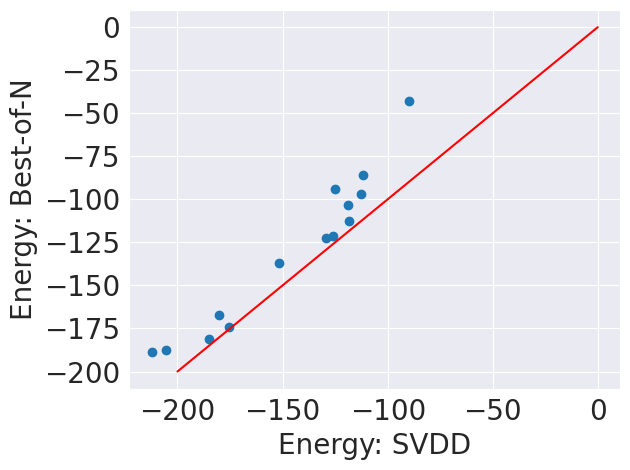

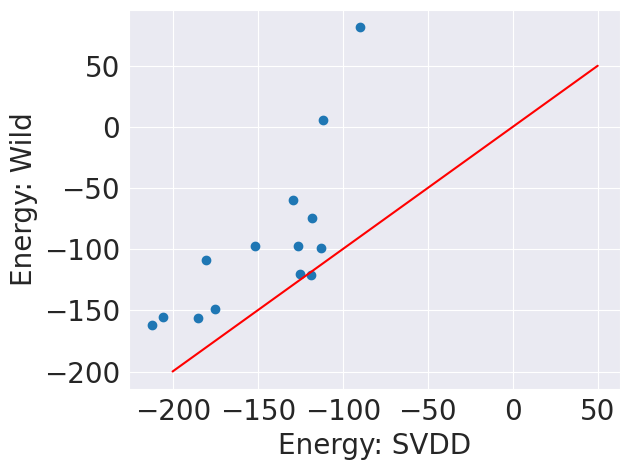

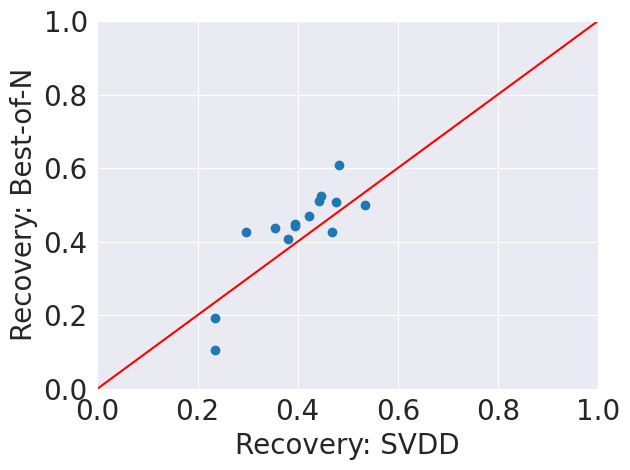

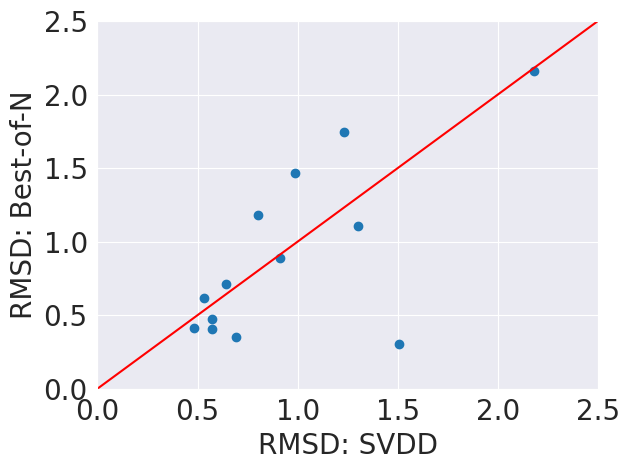

'\nsns.set_style("darkgrid")\nplt.scatter(np.max(recovery_num,1), np.max(recovery_dps_num,1) )\nplt.plot(np.linspace(0,0.5, 200), np.linspace(0,0.5, 200), c=\'red\' )\nplt.ylim(0,0.7)\nplt.xlim(0,0.7)\nplt.ylabel("Energy for Best-of-N",fontsize=15)\nplt.xlabel("Energy for SVDD",fontsize=15)\nplt.xticks(fontsize=20)\nplt.yticks(fontsize=20)\nplt.tight_layout()\n#plt.savefig("../RMSD_plot_min.png")\nplt.show()\n'

In [103]:
sns.set_style("darkgrid")
plt.scatter( np.delete(np.min(energy_num,1), -4) , np.delete(np.min(energy_dps_num,1), -4 ) )
#plt.scatter(np.median(energy_num,1), np.median(energy_dps_num,1), c ='green')
plt.plot(np.linspace(-200,0, 200), np.linspace(-200,0.0, 200), c='red' )
#plt.ylim(0,1.2)
#plt.xlim(0,1.2)
plt.ylabel("Energy: Best-of-N",fontsize=20)
plt.xlabel("Energy: SVDD",fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig("../energy_plot_min.png")
plt.show()

plt.scatter( np.delete(np.min(energy_num,1), -4 ) , np.delete(energy_wild, -4 ) )
#plt.scatter(np.median(energy_num,1), np.median(energy_dps_num,1), c ='green')
plt.plot(np.linspace(-200,50, 200), np.linspace(-200,50, 200), c='red' )
#plt.ylim(0,1.2)
#plt.xlim(0,1.2)
plt.ylabel("Energy: Wild",fontsize=20)
plt.xlabel("Energy: SVDD",fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig("../energy_plot_wild_min.png")
plt.show()



sns.set_style("darkgrid")
plt.scatter(np.delete(np.median(recovery_num,1), -4), np.delete(np.median(recovery_dps_num,1), -4) )
plt.plot(np.linspace(0,1.0, 200), np.linspace(0, 1.0, 200), c='red' )
plt.ylim(0,1.0)
plt.xlim(0,1.0)
plt.ylabel("Recovery: Best-of-N",fontsize=20)
plt.xlabel("Recovery: SVDD",fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig("../energy_recovery_plot_min.png")
plt.show()


sns.set_style("darkgrid")
plt.scatter(np.delete(np.median(rmsd_num,1), -4), np.delete(np.median(rmsd_dps_num,1), -4) )
plt.plot(np.linspace(0, 2.5, 200), np.linspace(0.0, 2.5, 200), c='red' )
plt.ylim(0,2.5)
plt.xlim(0,2.5)
plt.ylabel("RMSD: Best-of-N",fontsize=20)
plt.xlabel("RMSD: SVDD",fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig("../energy_RMSD_plot_min.png")
plt.show()
'''
sns.set_style("darkgrid")
plt.scatter(np.max(recovery_num,1), np.max(recovery_dps_num,1) )
plt.plot(np.linspace(0,0.5, 200), np.linspace(0,0.5, 200), c='red' )
plt.ylim(0,0.7)
plt.xlim(0,0.7)
plt.ylabel("Energy for Best-of-N",fontsize=15)
plt.xlabel("Energy for SVDD",fontsize=15)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
#plt.savefig("../RMSD_plot_min.png")
plt.show()
'''


In [43]:
print(np.mean(np.max(recovery_num, 1)))
print(np.mean(np.max(recovery_dps_num, 1)))

0.44593647
0.47410217


In [34]:
print(recovery_num)

[array([0.31914893, 0.25531915, 0.23404256, 0.21276596, 0.19148937],
      dtype=float32), array([0.39534885, 0.41860464, 0.4651163 , 0.39534885, 0.39534885],
      dtype=float32), array([0.31914893, 0.23404256, 0.23404256, 0.29787233, 0.3617021 ],
      dtype=float32), array([0.55813956, 0.53488374, 0.53488374, 0.55813956, 0.5116279 ],
      dtype=float32), array([0.44642857, 0.51785713, 0.48214287, 0.48214287, 0.5       ],
      dtype=float32), array([0.36619717, 0.36619717, 0.3802817 , 0.3802817 , 0.3802817 ],
      dtype=float32), array([0.40425533, 0.38297874, 0.4680851 , 0.5106383 , 0.4680851 ],
      dtype=float32), array([0.5116279 , 0.5813953 , 0.3488372 , 0.44186047, 0.41860464],
      dtype=float32), array([0.31914893, 0.12765957, 0.23404256, 0.10638298, 0.25531915],
      dtype=float32)]


In [6]:
from multiprocessing import Pool

# Function to run FastRelax in parallel
def run_parallel_fastrelax(pdbs, num_jobs=2):
    """ Run multiple FastRelax jobs in parallel. """
    # Create a multiprocessing pool with num_jobs workers
    with Pool(num_jobs) as pool:
        # Run FastRelax jobs in parallel
        results = pool.starmap(calcualte_energy, [(pdbs[i], i) for i in range(num_jobs)])
    return results


In [14]:

answers = run_parallel_fastrelax(pdb_list, num_jobs= len(pdb_list))

core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.873563 seconds.
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.8743 seconds.
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/tds4/sc_output/HEEH_KT_rd6_0746/1/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/tds4/sc_output/HEEH_KT_rd6_0746/2/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: To

In [15]:
answers_dps = run_parallel_fastrelax(pdb_list_dps, num_jobs= len(pdb_list_dps))

core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.824827 seconds.
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/dps/sc_output/HEEH_KT_rd6_0746/18/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.831321 seconds.
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 985 residue types
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/eval/dps/sc_output/HEEH_KT_rd6_0746/3/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.chemical.GlobalResidueTypeSet: Total time to initialize 0.836372 seconds.
core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard res

[-124.08243990883459, -97.68095862924979, -121.66679041234826, -97.75326035650076, -125.27315644490804]
[-88.17801953979126, -76.66222231365042, -91.14277496431242, -83.38724306499122, -8.293703766314266, -83.25153602783527, -67.2971458028018, -71.97660223949006, -63.35878944718848, -79.89966335547518, -29.886303804279365, -85.41955539524682, -65.87534667681832, -79.76545194659786, -81.96672645917971, -93.7231511599415, -44.71976328752351, -89.98119100590722, -31.5021807701646, -54.535033584842786, -88.91404645529335, -19.415917601253497, -84.06360178370105, -92.17681779781897, -87.52088701150025, -77.47515559000495, -71.66151393610753, -49.03076774454272, -40.03376440743105, -64.02513729099798]
[0.10638298 0.10638298 0.12765957 0.10638298 0.08510638 0.10638298
 0.10638298 0.08510638 0.08510638 0.06382979 0.08510638 0.08510638
 0.08510638 0.10638298 0.10638298 0.10638298 0.10638298 0.08510638
 0.08510638 0.10638298 0.14893617 0.08510638 0.14893617 0.14893617
 0.10638298 0.08510638 0.10

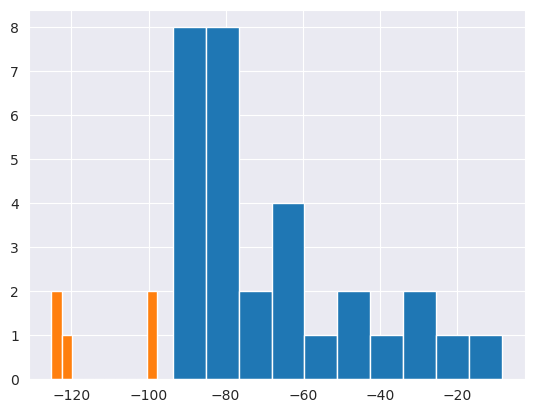

In [37]:
print(answers)
print(answers_dps)
print(recovery_dps)
print(recovery_list)
print(rmsd_list)
print(rmsd_dps)

plt.hist(answers_dps)
plt.hist(answers)
plt.show()

In [36]:
print(pdb_list)


['/data/ueharam/sc_tmp/eval/tds4/sc_output/EA|run5_0050_0004/0/folded/folded_codesign_seq_1.pdb', '/data/ueharam/sc_tmp/eval/tds4/sc_output/EA|run5_0050_0004/1/folded/folded_codesign_seq_1.pdb', '/data/ueharam/sc_tmp/eval/tds4/sc_output/EA|run5_0050_0004/2/folded/folded_codesign_seq_1.pdb', '/data/ueharam/sc_tmp/eval/tds4/sc_output/EA|run5_0050_0004/3/folded/folded_codesign_seq_1.pdb', '/data/ueharam/sc_tmp/eval/tds4/sc_output/EA|run5_0050_0004/4/folded/folded_codesign_seq_1.pdb']


In [18]:

init()
pose = pose_from_pdb(link)
pose2 = pose_from_pdb(link)
#scorefxn = pyrosetta.create_score_function("ref15_cart.wts")
scorefxn = pyrosetta.create_score_function("ref2015_cart")
print(scorefxn(pose))
# Create a TaskFactory to control packing
tf = TaskFactory()
# Restrict packing to only repack the existing rotamers (no mutations)
tf.push_back(RestrictToRepacking())
# Create and apply the packer
packer = PackRotamersMover(scorefxn, tf.create_task_and_apply_taskoperations(pose))
packer.apply(pose)
print(scorefxn(pose))


┌──────────────────────────────────────────────────────────────────────────────┐
│                                 PyRosetta-4                                  │
│              Created in JHU by Sergey Lyskov and PyRosetta Team              │
│              (C) Copyright Rosetta Commons Member Institutions               │
│                                                                              │
│ NOTE: USE OF PyRosetta FOR COMMERCIAL PURPOSES REQUIRE PURCHASE OF A LICENSE │
│         See LICENSE.PyRosetta.md or email license@uw.edu for details         │
└──────────────────────────────────────────────────────────────────────────────┘
PyRosetta-4 2024 [Rosetta PyRosetta4.Release.python310.linux 2024.39+release.59628fbc5bc09f1221e1642f1f8d157ce49b1410 2024-09-23T07:49:48] retrieved from: http://www.pyrosetta.org
core.init: Checking for fconfig files in pwd and ./rosetta/flags
core.init: Rosetta version: PyRosetta4.Release.python310.linux r387 2024.39+release.59628fb 59628fbc5bc09f1

basic.random.init_random_generator: 'RNG device' seed mode, using '/dev/urandom', seed=-2105752652 seed_offset=0 real_seed=-2105752652
basic.random.init_random_generator: RandomGenerator:init: Normal mode, seed=-2105752652 RG_type=mt19937
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/pseudo/pseduo_sc_output/1W4G/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue SER:CtermProteinFull 44
core.import_pose.import_pose: File '/data/ueharam/sc_tmp/pseudo/pseduo_sc_output/1W4G/folded/folded_codesign_seq_1.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue SER:CtermProteinFull 44
core.energy_methods.CartesianBondedEnergy: Creating new peptide-bonded energy container (44)
-10.61571115663154
core.pack.pack_rotamers: built 426 rotamers at 44 positions.
core.pack.interaction_graph.interaction_graph_factory: I

In [16]:
relax = FastRelax()
relax.set_scorefxn(scorefxn)
relax.apply(pose)
# Save the packed structure
pose.dump_pdb("packed_structure2.pdb")


core.scoring.ScoreFunctionFactory: SCOREFUNCTION: ref2015
protocols.relax.FastRelax: CMD: repeat  -52.683  0  0  0.55
protocols.relax.FastRelax: CMD: coord_cst_weight  -52.683  0  0  0.55
protocols.relax.FastRelax: CMD: scale:fa_rep  -74.261  0  0  0.022
core.pack.task: Packer task: initialize from command line()
core.pack.pack_rotamers: built 699 rotamers at 44 positions.
core.pack.interaction_graph.interaction_graph_factory: Instantiating DensePDInteractionGraph
protocols.relax.FastRelax: CMD: repack  -85.0744  0  0  0.022
protocols.relax.FastRelax: CMD: scale:fa_rep  -83.9221  0  0  0.02805
protocols.relax.FastRelax: CMD: min  -112.762  0.672838  0.672838  0.02805
protocols.relax.FastRelax: CMD: coord_cst_weight  -112.762  0.672838  0.672838  0.02805
protocols.relax.FastRelax: CMD: scale:fa_rep  -43.0092  0.672838  0.672838  0.14575
core.pack.task: Packer task: initialize from command line()
core.pack.pack_rotamers: built 601 rotamers at 44 positions.
core.pack.interaction_graph.int

True

In [17]:
rmsd = pyrosetta.rosetta.core.scoring.CA_rmsd(pose, pose2)
print(rmsd)
print(scorefxn(pose))

0.6583998203277588
-91.38037469993245


In [105]:
folder_path = "/home/ueharam1/projects4/seqft2/multiflow/fmif/log"

In [106]:
file_names = os.listdir(folder_path)
print(file_names)

['bb_rmsd_tds32MI6.npz', 'recovery_tds3EEHEE_rd4_0308.npz', 'recovery_dpsHEEH_KT_rd6_0746.npz', 'recovery_dps2LUM.npz', 'bb_rmsd_dpsEEHEE_rd4_0481.npz', 'recovery_dpsEEHEE_rd3_1716.npz', 'bb_rmsd_tds3EHEE_rd3_0035.npz', 'bb_rmsd_dps2EXD.npz', 'bb_rmsd_originalXX|run1_0455_0002.npz', 'recovery_tds32MWA.npz', 'recovery_dps5UYO.npz', 'bb_rmsd_dpsEA|run6_0680_0006.npz', 'recovery_originalr11_233_TrROS_Hall.npz', 'bb_rmsd_tds37JJK.npz', 'bb_rmsd_tds3HHH_rd1_0142.npz', 'bb_rmsd_dps2MH8.npz', 'bb_rmsd_dpsr6_560_TrROS_Hall.npz', 'recovery_tds3r14_263_TrROS_Hall.npz', 'recovery_dps1YRF.npz', 'recovery_originalv2_2L15.npz', 'bb_rmsd_tds32RRU.npz', 'bb_rmsd_dps2KR3.npz', 'recovery_tds31YRF.npz', 'recovery_dps2N4R.npz', 'bb_rmsd_dps2JZ2.npz', 'recovery_tds3r7_587_TrROS_Hall.npz', 'bb_rmsd_dpsEEHEE_rd3_0657.npz', 'bb_rmsd_tds32YSF.npz', 'bb_rmsd_dps2JVD.npz', 'recovery_dpsGG|run6_0851_0003.npz', 'bb_rmsd_dpsGG|run1_1390_0006.npz', 'recovery_tds35UBS.npz', 'bb_rmsd_dps2MYX.npz', 'bb_rmsd_dps5VNT.npz

In [107]:
file_names = [f for f in file_names if os.path.isfile(os.path.join(folder_path, f)) ]

In [120]:
file_names_tds = [ f for f in file_names if ("tds3" in f) and ("rmsd" in f) ]

2MC5 1.186044869032325 1.881500485602178 2 2
[1.3401615  1.59567079 1.18604487 1.41896897 1.72508085] [2.93662188 2.76867547 1.88150049 2.36918839 3.41760283 3.85614209
 5.74258292 2.57010961 8.85767758 2.97708601 2.83383325 2.87812994
 2.28235563 7.56822618 7.39659684 4.45707878 2.02350936 3.15698844
 2.83306736 3.82600821 9.66901324 2.78260467 6.02673465 2.55271131
 2.80519427 3.94737648 3.78778374 3.48074955 2.54544053 4.94781398]
XX|run7_0974_0003 0.7390477892996746 1.3372648279860533 3 4
[0.97394654 1.00568526 0.77207635 0.73904779 0.77845175] [4.26763028 8.03447506 1.79727557 4.35805864 1.33726483 4.01980396
 4.53523863 2.14091182 2.61754927 1.66160489 4.61415321 4.24173914
 3.9872825  4.20244466 7.0341286  5.19071159 8.58001381 3.90516073
 2.78014219 1.76862789 2.30593687 9.74355367 2.43571185 4.29816561
 1.88206623 4.99042943 3.00932877 2.34081865 1.8713398  2.1623764 ]


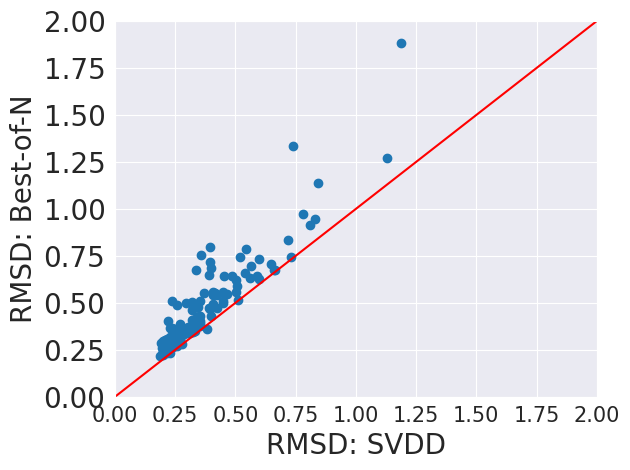

'\nsns.kdeplot(np.array(tds_list), bw=0.3)\nsns.kdeplot(np.array(dps_list), bw=0.1)\nplt.xlim(0,5)\nplt.ylim(0,5)\nplt.show()\n'

In [123]:
tds_list = []
dps_list = []

for j in file_names_tds:
    i = j[12:-4]
    if os.path.isfile(os.path.join(folder_path, 'bb_rmsd_dps' + i + ".npz")):
        aaa = np.load('bb_rmsd_tds3' + i + ".npz")['reward'] 
        bbb = np.load('bb_rmsd_dps' + i + ".npz")['reward']
        tds_list.append(np.min(aaa))
        dps_list.append(np.min(bbb))
        '''
        if np.median(bbb)>2.4:
            print(i,np.median(aaa), np.median(bbb))
            print(aaa,bbb) 
        '''
        if np.min(bbb)-np.min(aaa)>0.5:
            print(i,np.min(aaa), np.min(bbb), np.argmin(aaa),np.argmin(bbb))
            print(aaa,bbb) 

sns.set_style("darkgrid")
plt.scatter(tds_list,dps_list)
plt.plot(np.linspace(0,5.0, 100),np.linspace(0,5.0, 100), c='red' )
plt.ylim(0,2.0)
plt.xlim(0,2.0)
plt.ylabel("RMSD: Best-of-N",fontsize=20)
plt.xlabel("RMSD: SVDD",fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig("../RMSD_plot_min.png")
plt.show()

'''
sns.kdeplot(np.array(tds_list), bw=0.3)
sns.kdeplot(np.array(dps_list), bw=0.1)
plt.xlim(0,5)
plt.ylim(0,5)
plt.show()
'''


In [80]:
aaa = np.load("recovery_tds3" + "5LWC"  +".npz")
bbb = np.load("recovery_dps" + "5LWC"  +".npz")
print(aaa['reward'],bbb['reward'])


[0.41860464 0.3488372  0.4883721  0.41860464 0.44186047] [0.4883721  0.41860464 0.4651163  0.39534885 0.3488372  0.41860464
 0.37209302 0.4883721  0.4651163  0.44186047 0.39534885 0.41860464
 0.41860464 0.37209302 0.39534885 0.37209302 0.41860464 0.39534885
 0.37209302 0.39534885 0.41860464 0.41860464 0.4883721  0.39534885
 0.41860464 0.44186047 0.37209302 0.44186047 0.4651163  0.41860464]


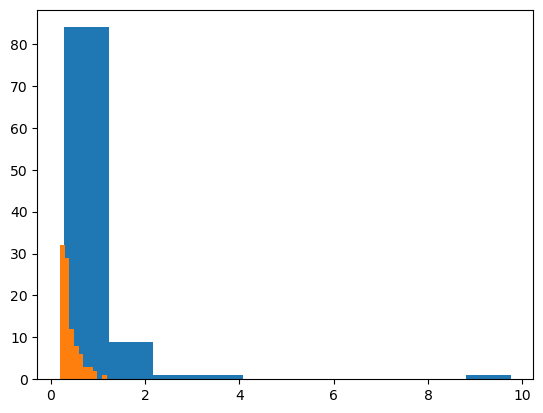

In [49]:
plt.hist(dps_list)
plt.hist(tds_list)
plt.show()

In [11]:
protein_name = ['7JJK', '5JRT', '2MA4', '2M2J', '1F0M','XX|run7_0974_0003', 'r6_560_TrROS_Hall', 'HEEH_KT_rd6_0746', "EA|run5_0050_0004"]

In [12]:
rmsd_dps = []
for i in protein_name:
    aaa = np.load('bb_rmsd_dps' + i + ".npz")['reward']
    print(aaa)
    rmsd_dps.append(aaa) 


[0.4410084  0.59176039 0.45145455 0.44970459 0.50661938]
[0.46854556 0.44389021 0.47895908 0.50555919 0.47741084]
[0.61787121 0.75603342 0.6224454  1.32921106 1.40031869]
[0.41965503 0.33267921 0.42809772 0.42879656 0.46589316]
[0.41549297 0.42319761 0.47514897 0.42891586 0.40659973]
[1.94053435 6.77246209 1.62143008 2.22271422 1.95958624 3.16149614
 1.21630866 0.85365418 2.40910381 0.80030036 2.34858522 1.76146735
 2.84299723 1.18423445 2.62548013 1.99160568 2.23729693 2.79561557
 1.33718476 2.61712446 2.06611612 2.29379507 2.41156926 1.99217404
 2.16815288 1.45249778 2.19831049 0.98964751 0.98545978 2.28442718
 2.06351372 2.19283081 2.28053515 2.18215699 2.62602395 1.95421477
 1.73041159 2.04738521 2.15278409 2.7440821  2.01192755 1.44428274
 1.44592136 2.57128148 2.56886024]
[1.22838396 1.4268366  1.1403516  0.6813687  0.54589754 2.01988234
 0.91866609 0.74657886 0.76920162 1.55742859 2.23279804 0.87491063
 0.79697206 0.71910023 1.22332716 1.30468871 0.93509538 1.29998937
 1.1495169

In [13]:
rmsd_decoding = []
for i in protein_name:
    aaa = np.load('bb_rmsd_tds3' + i + ".npz")['reward']
    print(aaa)
    rmsd_decoding.append(aaa) 

[0.28020789 0.24473722 0.26597096 0.23587783 0.2536964 ]
[0.30401938 0.31181058 0.35490906 0.30606584 0.31319212]
[0.56265247 0.56181376 0.54356394 0.50161262 0.58844356]
[0.30353701 0.31278484 0.27931044 0.36101671 0.27681217]
[0.30465452 0.26668783 0.30120356 0.28042882 0.31930495]
[0.97394654 1.00568526 0.77207635 0.73904779 0.77845175]
[0.52639742 0.44888549 0.45394749 0.51955715 0.39526771]
[1.16867942 0.73155662 0.65700586 0.54528995 0.87882307]
[0.23702305 0.28217309 0.39367855 0.29375116 0.29298126]


In [43]:
rmsd_dps = np.array(rmsd_dps)
rmsd_decoding = np.array(rmsd_decoding)

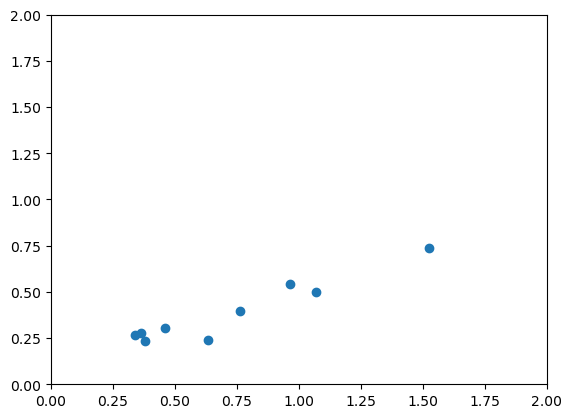

In [48]:
plt.scatter(np.min(rmsd_dps,1), np.min(rmsd_decoding,1) )
plt.xlim(0,2.0)
plt.ylim(0,2.0)
plt.show()

In [49]:
recovery_dps = []
for i in protein_name:
    aaa = np.load('recovery_dps' + i + ".npz")['reward']
    print(aaa)
    recovery_dps.append(aaa) 

[0.3508772  0.36842105 0.33333334 0.3859649  0.4385965 ]
[0.47457626 0.5423729  0.47457626 0.47457626 0.45762712]
[0.45714286 0.45714286 0.44285715 0.44285715 0.45714286]
[0.4225352 0.4225352 0.3802817 0.3943662 0.3802817]
[0.45454547 0.46969697 0.43939394 0.45454547 0.43939394]
[0.21276596 0.21276596 0.17021276 0.25531915 0.27659574]
[0.60714287 0.625      0.51785713 0.5714286  0.6785714 ]
[0.5116279  0.37209302 0.5813953  0.5813953  0.41860464]
[0.21276596 0.23404256 0.23404256 0.14893617 0.17021276]
